Temperature Forecast Project using ML

Project Description
This data is for the purpose of bias correction of next-day maximum and minimum air
temperatures forecast of the LDAPS model operated by the Korea Meteorological
Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017.
The input data is largely composed of the LDAPS model's next-day forecast data, in-situ
maximum and minimum temperatures of present-day, and geographic auxiliary variables. There
are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. Hindcast
validation was conducted for the period from 2015 to 2017.

In [1]:
# Importing neccessary librarys
import pandas as pd 
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt 
import warnings 
warnings.filterwarnings('ignore')

In [24]:
# Load data set through pandas library
df= pd.read_csv(r"C:\Users\ganes\Downloads\temperature.csv")
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [25]:
# Data type of columns 
df.dtypes

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

Extract relevant date component such as month. These components can capture seasonal, monthly based  patterns.

In [26]:
# Convert the 'Date' column to a datetime data type
df['Date'] = pd.to_datetime(df['Date'])

In [27]:
# Extract day and month and create new columns
df['Day'] = df['Date'].dt.day
df['Month'] = df['Date'].dt.month

In [28]:
# Apply cyclical encoding for month
df['Month_sin'] = np.sin(2 * np.pi * df['Month'] / 12)
df['Month_cos'] = np.cos(2 * np.pi * df['Month'] / 12)

# Drop the original 'Month' column 
df.drop(columns=['Month'], inplace=True)


In [29]:
# For checking dataset diemensions 
df.shape 

(7752, 28)

In [30]:
# Summarizing the distribution of the numerical variables.
df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month_sin,Month_cos
count,7750.000000,7682.000000,7682.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,...,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7725.000000,7725.000000,7750.000000,7750.000000,7750.000000
mean,13.000000,29.768211,23.225059,56.759372,88.374804,29.613447,23.512589,7.097875,62.505019,0.368774,...,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,22.932220,16.370968,-0.404653,-0.426685
std,7.211568,2.969999,2.413961,14.668111,7.192004,2.947191,2.345347,2.183836,33.730589,0.262458,...,0.050352,0.079435,54.279780,1.370444,429.158867,3.128010,2.487613,8.241331,0.569387,0.574525
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000,7.000000,-1.000000,-1.000000
25%,7.000000,27.800000,21.700000,45.963543,84.222862,27.673499,22.089739,5.678705,37.266753,0.146654,...,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.300000,8.000000,-0.866025,-0.866025
50%,13.000000,29.900000,23.400000,55.039024,89.793480,29.703426,23.760199,6.547470,56.865482,0.315697,...,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000,16.000000,-0.500000,-0.500000
75%,19.000000,32.000000,24.900000,67.190056,93.743629,31.710450,25.152909,8.032276,84.223616,0.575489,...,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000,24.000000,-0.500000,-0.500000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000,31.000000,1.000000,1.000000


In [31]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 28 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   station           7750 non-null   float64       
 1   Date              7750 non-null   datetime64[ns]
 2   Present_Tmax      7682 non-null   float64       
 3   Present_Tmin      7682 non-null   float64       
 4   LDAPS_RHmin       7677 non-null   float64       
 5   LDAPS_RHmax       7677 non-null   float64       
 6   LDAPS_Tmax_lapse  7677 non-null   float64       
 7   LDAPS_Tmin_lapse  7677 non-null   float64       
 8   LDAPS_WS          7677 non-null   float64       
 9   LDAPS_LH          7677 non-null   float64       
 10  LDAPS_CC1         7677 non-null   float64       
 11  LDAPS_CC2         7677 non-null   float64       
 12  LDAPS_CC3         7677 non-null   float64       
 13  LDAPS_CC4         7677 non-null   float64       
 14  LDAPS_PPT1        7677 n

Cleaning miussing value

In [32]:
df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
Day                  2
Month_sin            2
Month_cos            2
dtype: int64

as we know that the columns are more related with date . so we can not replace null value with mean and median of data . 
so we replace every value with previous value . That keep pattern of date based .

In [33]:
# Forward fill (replace null values with previous values in the same column)
df.fillna(method='ffill', inplace=True)

# Verify that missing values have been replaced
missing_values_after_ffill = df.isnull().sum()
print("Missing Values After Forward Fill:")
print(missing_values_after_ffill)

Missing Values After Forward Fill:
station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
Day                 0
Month_sin           0
Month_cos           0
dtype: int64


Data Visualization

Using Univariate Plots

In [34]:
df.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'Day',
       'Month_sin', 'Month_cos'],
      dtype='object')

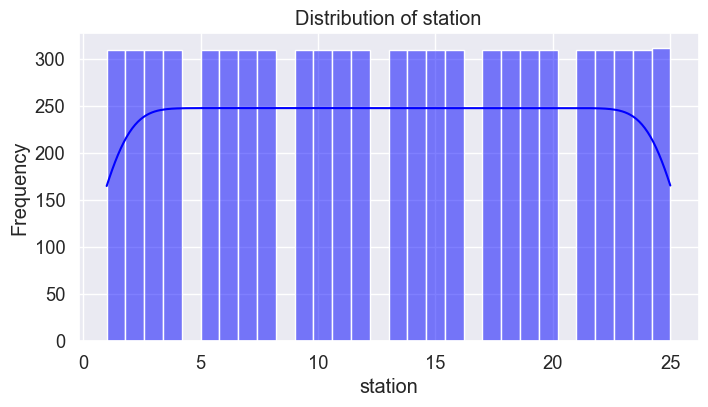

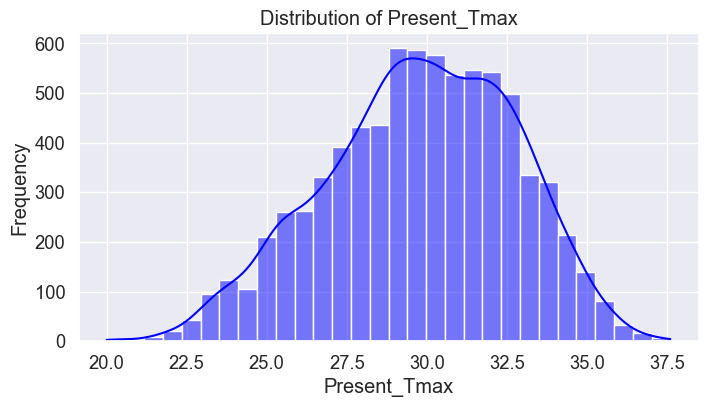

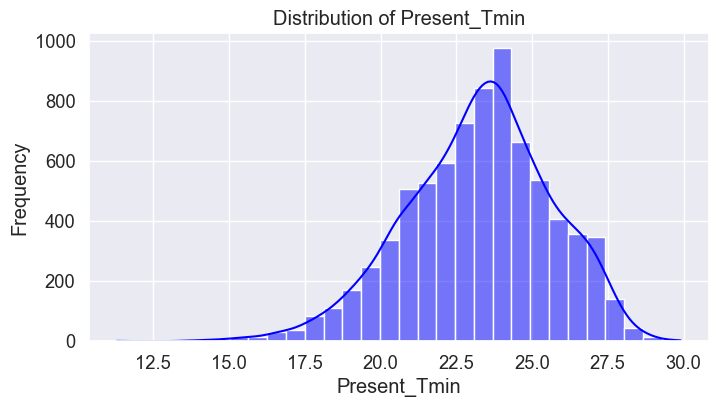

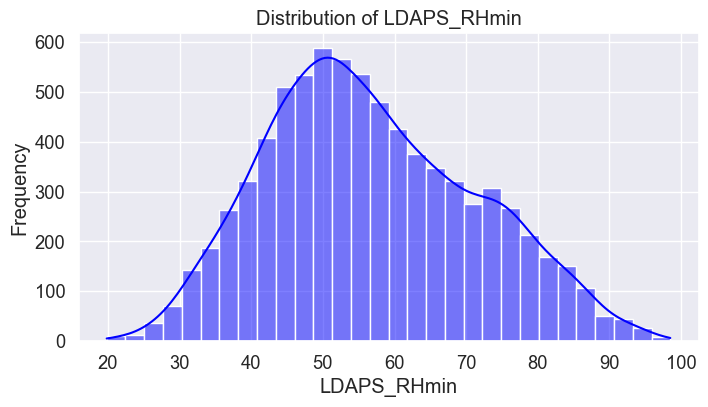

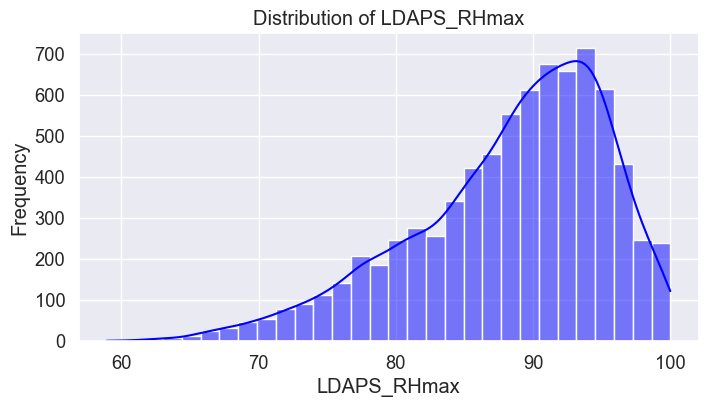

...

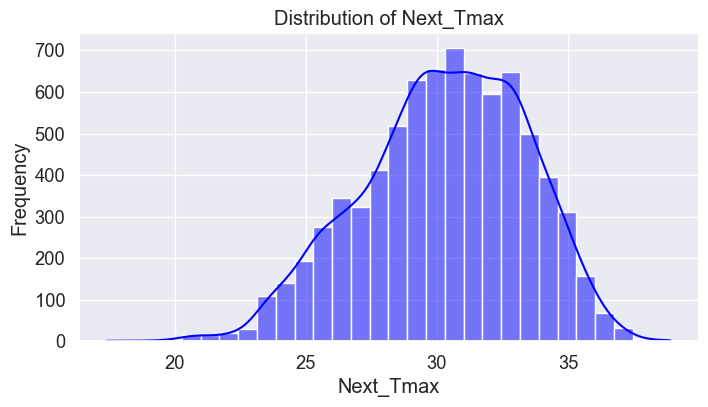

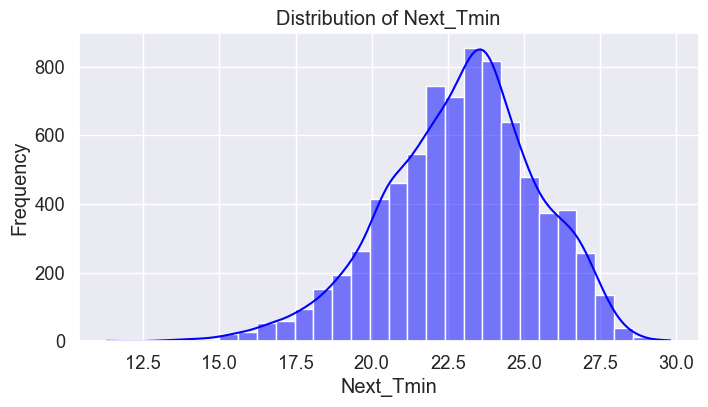

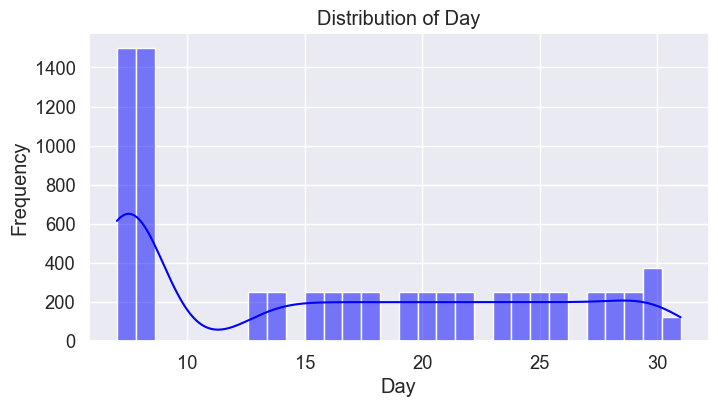

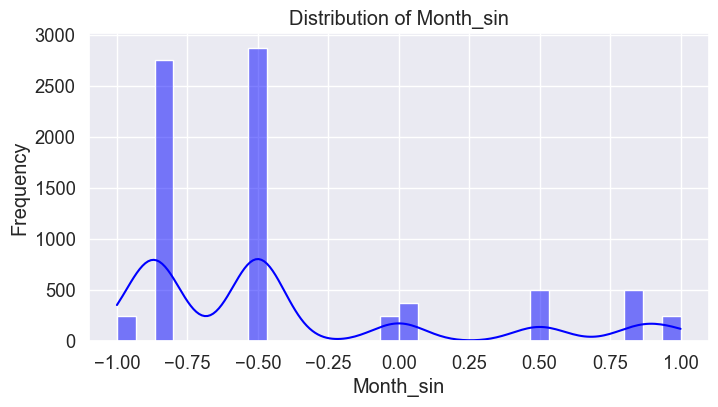

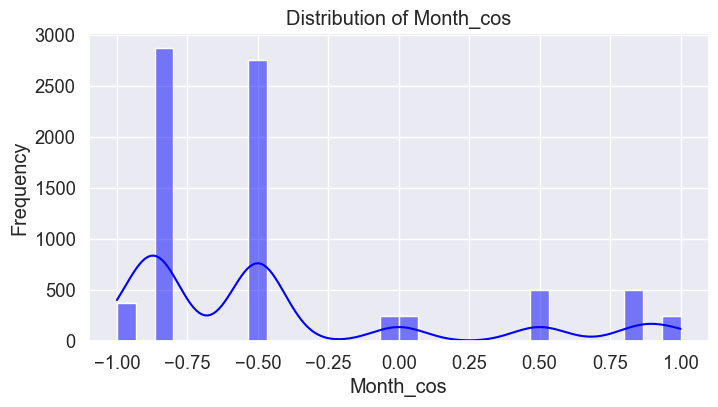

In [35]:
# Define the columns you want to create distribution plots for
columns_to_plot = df.drop(columns='Date')

# Create distribution plots for the selected columns
for column in columns_to_plot:
    plt.figure(figsize=(8, 4)) 
    sns.histplot(df[column], kde=True, bins=30, color='blue')  
    plt.title(f'Distribution of {column}') 
    plt.xlabel(column)  
    plt.ylabel('Frequency')  
    plt.show()  

2.Using Multivariate Plots

In [36]:
columns_to_plot.columns

Index(['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'Day', 'Month_sin',
       'Month_cos'],
      dtype='object')

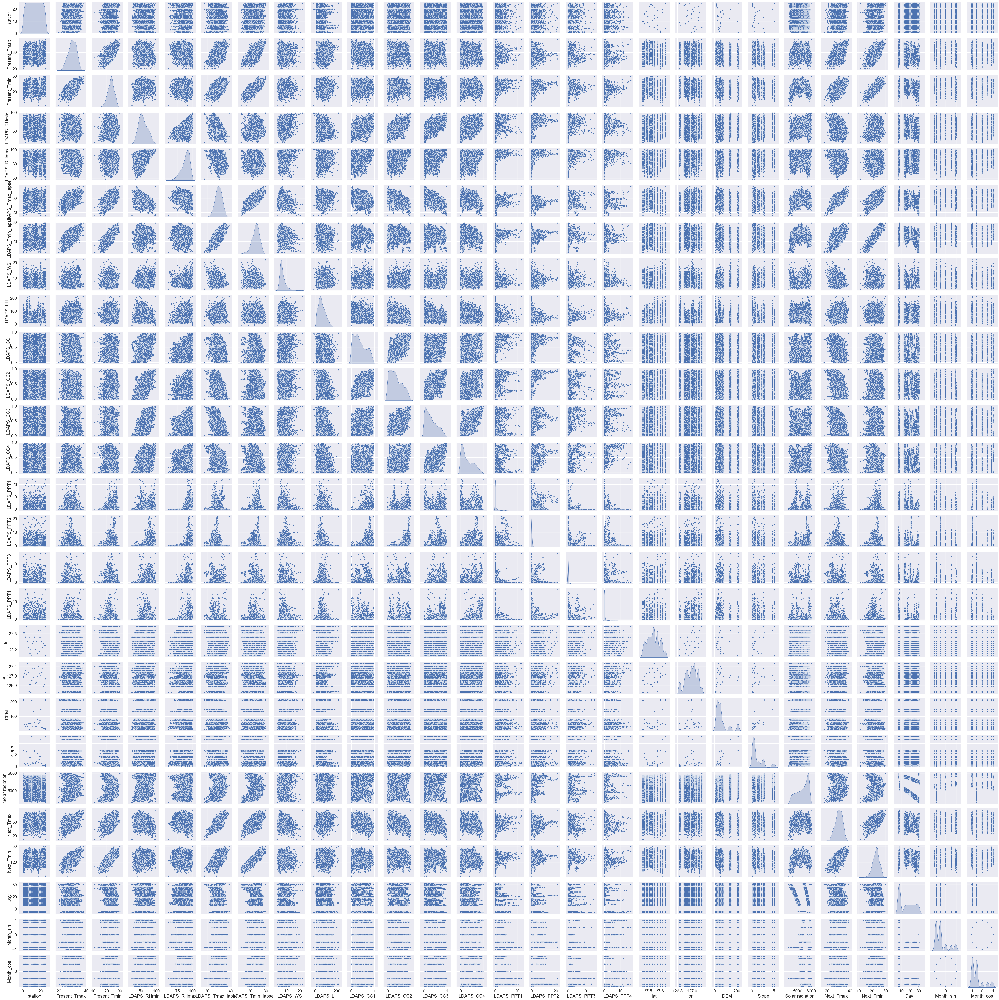

In [37]:
# Set the font size for the column labels
sns.set(font_scale=1.8)  

# Create a pair plot for the selected columns
sns.pairplot(columns_to_plot, diag_kind='kde', markers='o', palette='viridis')

# Show the pair plot
plt.show()

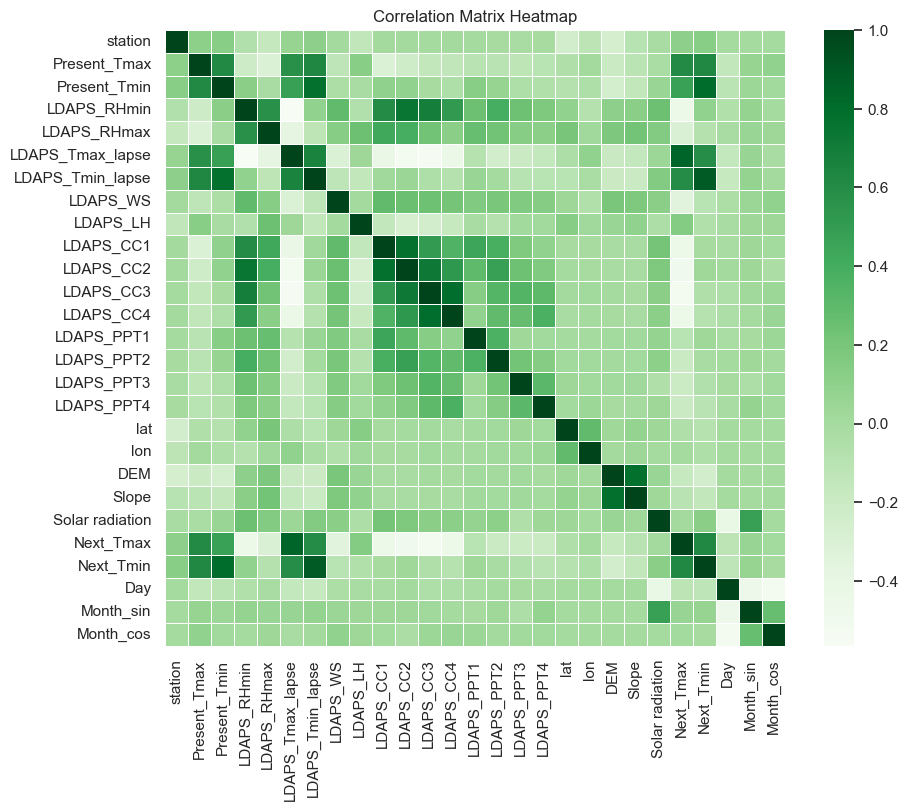

In [42]:
# Set the font size for the column labels
sns.set(font_scale=1)

# Calculate the correlation matrix
correlation_matrix = df.corr()

# Create a heatmap to visualize the correlation matrix
plt.figure(figsize=(10, 8))  # Set the figure size
sns.heatmap(correlation_matrix, cmap='Greens', fmt=".2f", linewidths=0.5)

# Set the plot title
plt.title('Correlation Matrix Heatmap')

# Show the plot
plt.show()


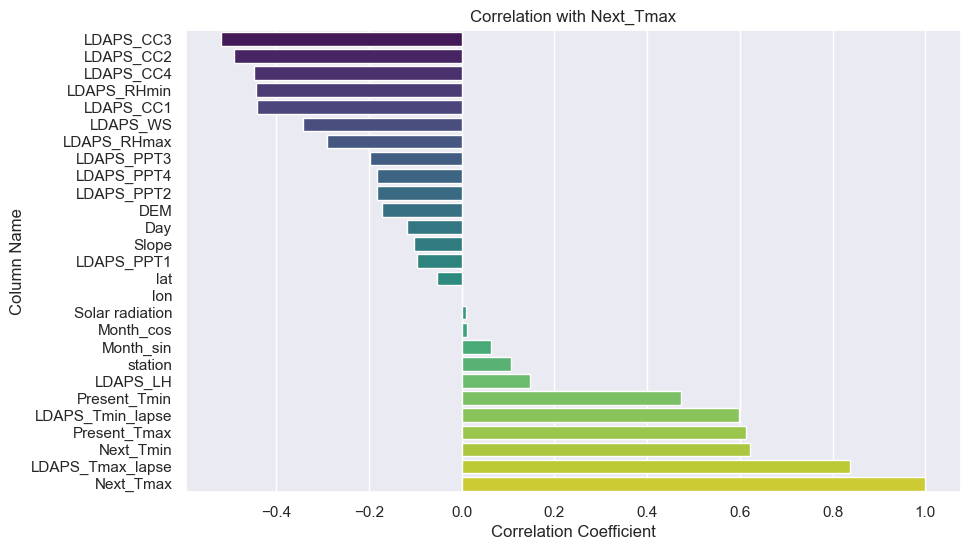

In [43]:
target_column = "Next_Tmax"

# Calculate correlations between the target column and all other numerical columns
correlations = df.corr()[target_column].sort_values(ascending=True)

# Create a bar plot for correlations
plt.figure(figsize=(10, 6))
sns.barplot(x=correlations.values, y=correlations.index, palette="viridis")
plt.title(f"Correlation with {target_column}")
plt.xlabel("Correlation Coefficient")
plt.ylabel("Column Name")
plt.show()


Box Plot

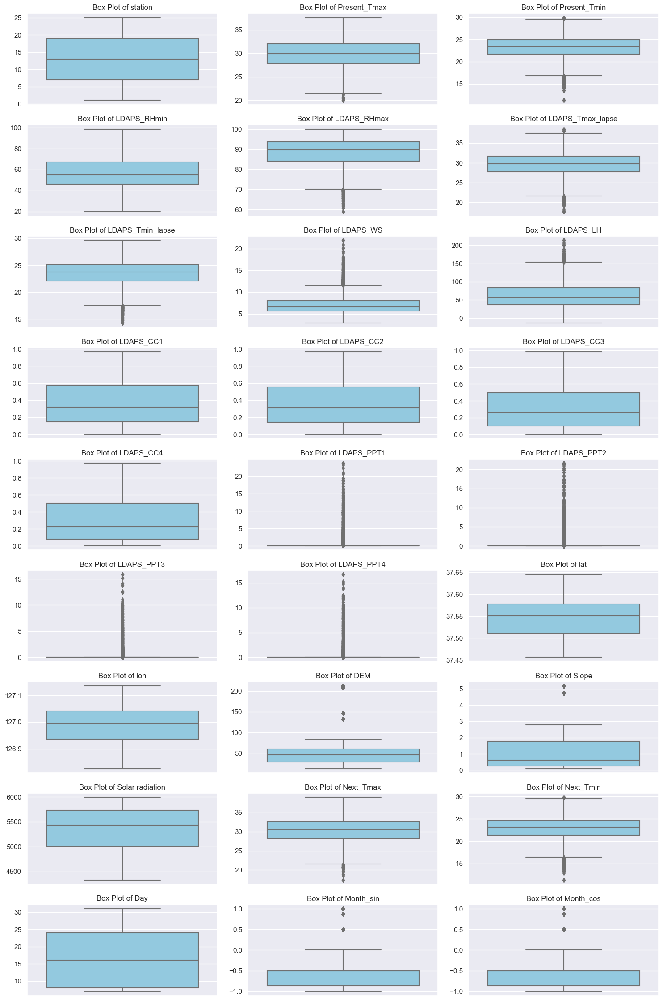

In [54]:
# Set the figure size to control the dimensions of individual plots
plt.figure(figsize=(15,25))

# Iterate through all columns and create box plots
for i, column in enumerate(columns_to_plot.columns, 1):
    plt.subplot(10, 3, i)  # 3 rows, 5 columns for visualization
    sns.boxplot(data=df[column], color='skyblue')
    plt.title(f'Box Plot of {column}')
    plt.xticks([])  

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plots
plt.show()

Outlier Removal 

In [56]:
# Select all numerical columns in the DataFrame
numerical_columns = df.select_dtypes(include='number').columns
numerical_columns

Index(['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'Day', 'Month_sin',
       'Month_cos'],
      dtype='object')

In [57]:
columns_include=['Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax','LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH','LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1','LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4','Solar radiation']

In [58]:
def remove_outliers_iqr(data, col_name, lower_factor=1.5, upper_factor=1.5):
    q1 = data[col_name].quantile(0.25)
    q3 = data[col_name].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - lower_factor * iqr
    upper_bound = q3 + upper_factor * iqr
    return data[(data[col_name] >= lower_bound) & (data[col_name] <= upper_bound)]

# Apply function to each column
columns_include 
for col in columns_include:
    df = remove_outliers_iqr(df, col)


In [59]:
# after outlier removal dataframe shape 
df.shape

(3260, 28)

Around 50% are remove that is huge data loss . most of outlier in wind speed , cloud spliting based that data is unique in nature , so we can not treat as outlier.we retail our original dataset .

In [64]:
# Load data set through pandas library
df= pd.read_csv(r"C:\Users\ganes\Downloads\temperature.csv")

# Convert the 'Date' column to a datetime data type
df['Date'] = pd.to_datetime(df['Date'])

# Extract day and month and create new columns
df['Day'] = df['Date'].dt.day
df['Month'] = df['Date'].dt.month

# Apply cyclical encoding for month
df['Month_sin'] = np.sin(2 * np.pi * df['Month'] / 12)
df['Month_cos'] = np.cos(2 * np.pi * df['Month'] / 12)

# Drop the original 'Month' column 
df.drop(columns=['Month'], inplace=True)

# Forward fill (replace null values with previous values in the same column)
df.fillna(method='ffill', inplace=True)


skewness removal

In [65]:
# Calculate the skewness of each column
skewness = df.skew()
print("Skewness of Columns:")
print(skewness)

Skewness of Columns:
station            -0.000100
Present_Tmax       -0.262761
Present_Tmin       -0.365327
LDAPS_RHmin         0.305376
LDAPS_RHmax        -0.840464
LDAPS_Tmax_lapse   -0.237722
LDAPS_Tmin_lapse   -0.576234
LDAPS_WS            1.572524
LDAPS_LH            0.677272
LDAPS_CC1           0.435814
LDAPS_CC2           0.471318
LDAPS_CC3           0.640210
LDAPS_CC4           0.663585
LDAPS_PPT1          5.077981
LDAPS_PPT2          5.776895
LDAPS_PPT3          6.458810
LDAPS_PPT4          6.826930
lat                 0.087062
lon                -0.285213
DEM                 1.723257
Slope               1.563020
Solar radiation    -0.511210
Next_Tmax          -0.339228
Next_Tmin          -0.402800
Day                 0.245140
Month_sin           1.262488
Month_cos           1.312113
dtype: float64


Most of columns have skewness value in acceptable range . 

Normalization of data

In [66]:
from sklearn.preprocessing import MinMaxScaler

# Define the columns you want to normalize (numerical columns)
columns_to_normalize = ['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax','LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1','LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
       'Solar radiation','Day', 'Month_sin','Month_cos']

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Fit the scaler on the selected columns and transform the data
df[columns_to_normalize] = scaler.fit_transform(df[columns_to_normalize])



Model Development

In [67]:
#Importing Machine learning Model library
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score 
from sklearn.linear_model import LinearRegression, Ridge, Lasso
import matplotlib.pyplot as plt
from sklearn.svm import SVR

In [ ]:
For 'Next_Tmax' column as label .

Splitting Data into train test

In [72]:
# divide dataset into feature and label column.
X = df.drop(['Next_Tmax','Next_Tmin','Date'], axis =1)
Y = df["Next_Tmax"]

Model: Linear Regression
Mean Squared Error: 2.096664203833504
R-squared (R2): 0.787548418613286
Model: Ridge Regression
Mean Squared Error: 2.102589933067298
R-squared (R2): 0.7869479740860759
Model: Lasso Regression
Mean Squared Error: 9.869964899583762
R-squared (R2): -0.00010752666736757455
Model: Random Forest Regressor
Mean Squared Error: 0.8730719426176656
R-squared (R2): 0.911533036842831
Model: SVR
Mean Squared Error: 2.1119226518251812
R-squared (R2): 0.7860023048391243
Model: Decision Tree Regressor
Mean Squared Error: 2.0969310122501614
R-squared (R2): 0.7875213833493927
Best Model: Random Forest Regressor with R-squared (R2) score of 0.911533036842831


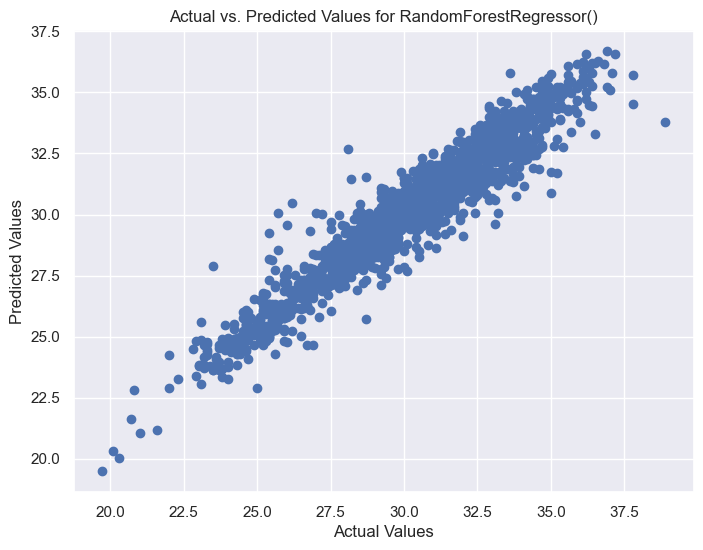

In [73]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
import numpy as np
import matplotlib.pyplot as plt


# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=39)

# A list of regression models to evaluate for regression
models = [
    ('Linear Regression', LinearRegression()),
    ('Ridge Regression', Ridge(alpha=1.0)),
    ('Lasso Regression', Lasso(alpha=1.0)),
    ('Random Forest Regressor', RandomForestRegressor(n_estimators=100)),
    ('SVR', SVR(kernel='linear')),
    ('Decision Tree Regressor', DecisionTreeRegressor())
]

# Initialize variables to keep track of the best model and its performance
best_model = None
best_score = -np.inf

# Iterate through the models, fit them, and evaluate their performance
for model_name, model in models:
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    # Calculate metrics (you can add more if needed)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    print(f'Model: {model_name}')
    print(f'Mean Squared Error: {mse}')
    print(f'R-squared (R2): {r2}')
    
    # Check if this model has the best performance so far
    if r2 > best_score:
        best_score = r2
        best_model = model_name

# Print the best model
print(f'Best Model: {best_model} with R-squared (R2) score of {best_score}')

# We can visualize the actual vs. predicted values for the best model
best_model_index = [model[0] for model in models].index(best_model)
best_model = models[best_model_index][1]
y_pred_best = best_model.predict(X_test)

plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred_best)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title(f"Actual vs. Predicted Values for {best_model}")
plt.show()


Hyper parameter tunning for Random Forest regression .

In [76]:
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from scipy.stats import randint

# Define the Random Forest Regressor model
rf_model = RandomForestRegressor()

# Define a parameter distribution for hyperparameter tuning
param_dist = {
    'n_estimators': randint(100, 500),  # Randomly sample from 100 to 500
    'max_depth': [None] + list(range(10, 31)),  # Include None and values from 10 to 30
    'min_samples_split': randint(2, 11),  # Randomly sample from 2 to 10
    'min_samples_leaf': randint(1, 5),  # Randomly sample from 1 to 4
    'max_features': ['auto', 'sqrt', 'log2']  # List of possible values
}

# Create a RandomizedSearchCV object with cross-validation
random_search = RandomizedSearchCV(estimator=rf_model, param_distributions=param_dist, n_iter=50,
                                   cv=5, scoring='neg_mean_squared_error', n_jobs=-1, random_state=42)

# Perform hyperparameter tuning
random_search.fit(X_train, y_train)

# Get the best hyperparameters
best_params = random_search.best_params_
print("Best Hyperparameters:", best_params)

# Get the best model
best_rf_model = random_search.best_estimator_

Best Hyperparameters: {'max_depth': 18, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 317}


Cross Validation

In [77]:
from sklearn.model_selection import cross_val_score
score = cross_val_score(best_rf_model, X, Y, cv = 5)
print('Cross Validation Score :')
print("Score :" ,score)
print("Mean Score :",score.mean())
print("Std deviation :",score.std())

Cross Validation Score :
Score : [0.72719609 0.60358072 0.64708234 0.79214964 0.66155866]
Mean Score : 0.6863134891862985
Std deviation : 0.06613512676234641


Saving model

In [78]:
import joblib
joblib.dump(best_rf_model,'Next_Tmax.pkl')

['Next_Tmax.pkl']

Predicting the Final Model

In [79]:
actual_Next_Tmax= y_test

# Make predictions for the selected data points
Pre_Next_Tmax = best_rf_model.predict(X_test)

# Create a DataFrame to display the results
result_df = pd.DataFrame({
    'Actual Next_Tmax': actual_Next_Tmax,
    'Predicted Next_Tmax': Pre_Next_Tmax
})

result_df.head(10)

,Actual Next_Tmax,Predicted Next_Tmax
6979,33.0,32.590504
7489,29.8,29.119238
4586,30.6,29.996771
706,29.8,30.079400
300,23.2,24.743632
126,30.8,31.258335
6009,31.7,30.802116
4505,25.3,25.912462
1053,34.8,34.603855
863,32.2,32.252252


For 'Next_Tmin' column as label .

Splitting Data into train test

In [80]:
# divide dataset into feature and label column.
X = df.drop(['Next_Tmax','Next_Tmin','Date'], axis =1)
Y = df["Next_Tmin"]

Model: Linear Regression
Mean Squared Error: 0.9969972813160539
R-squared (R2): 0.8391234676297994
Model: Ridge Regression
Mean Squared Error: 0.9984876914647226
R-squared (R2): 0.8388829734769861
Model: Lasso Regression
Mean Squared Error: 6.200311017721948
R-squared (R2): -0.0004887223274667729
Model: Random Forest Regressor
Mean Squared Error: 0.5702927782076084
R-squared (R2): 0.9079769560928986
Model: SVR
Mean Squared Error: 1.0103138148617963
R-squared (R2): 0.836974697738268
Model: Decision Tree Regressor
Mean Squared Error: 1.2659767891682787
R-squared (R2): 0.7957206506784947
Best Model: Random Forest Regressor with R-squared (R2) score of 0.9079769560928986


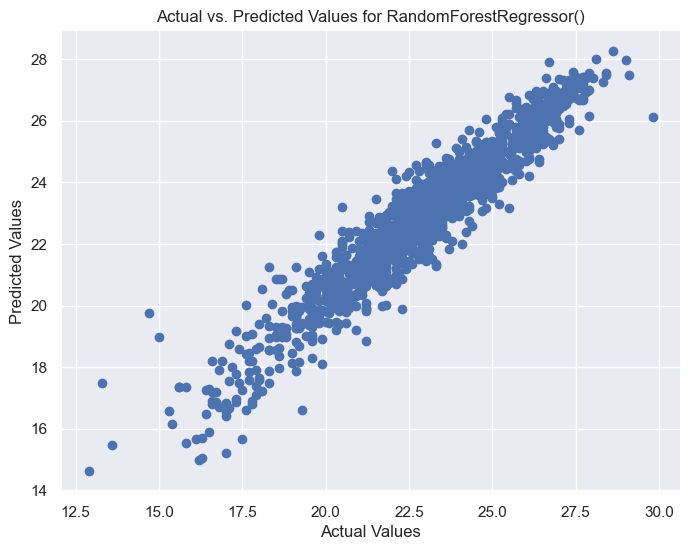

In [81]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
import numpy as np
import matplotlib.pyplot as plt


# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=39)

# A list of regression models to evaluate for regression
models = [
    ('Linear Regression', LinearRegression()),
    ('Ridge Regression', Ridge(alpha=1.0)),
    ('Lasso Regression', Lasso(alpha=1.0)),
    ('Random Forest Regressor', RandomForestRegressor(n_estimators=100)),
    ('SVR', SVR(kernel='linear')),
    ('Decision Tree Regressor', DecisionTreeRegressor())
]

# Initialize variables to keep track of the best model and its performance
best_model = None
best_score = -np.inf

# Iterate through the models, fit them, and evaluate their performance
for model_name, model in models:
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    # Calculate metrics (you can add more if needed)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    print(f'Model: {model_name}')
    print(f'Mean Squared Error: {mse}')
    print(f'R-squared (R2): {r2}')
    
    # Check if this model has the best performance so far
    if r2 > best_score:
        best_score = r2
        best_model = model_name

# Print the best model
print(f'Best Model: {best_model} with R-squared (R2) score of {best_score}')

# We can visualize the actual vs. predicted values for the best model
best_model_index = [model[0] for model in models].index(best_model)
best_model = models[best_model_index][1]
y_pred_best = best_model.predict(X_test)

plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred_best)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title(f"Actual vs. Predicted Values for {best_model}")
plt.show()


Hyper parameter tunning for Random Forest regression .

In [83]:
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from scipy.stats import randint

# Define the Random Forest Regressor model
rf_model = RandomForestRegressor()

# Define a parameter distribution for hyperparameter tuning
param_dist = {
    'n_estimators': randint(100, 500),  # Randomly sample from 100 to 500
    'max_depth': [None] + list(range(10, 31)),  # Include None and values from 10 to 30
    'min_samples_split': randint(2, 11),  # Randomly sample from 2 to 10
    'min_samples_leaf': randint(1, 5),  # Randomly sample from 1 to 4
    'max_features': ['auto', 'sqrt', 'log2']  # List of possible values
}

# Create a RandomizedSearchCV object with cross-validation
random_search = RandomizedSearchCV(estimator=rf_model, param_distributions=param_dist, n_iter=50,
                                   cv=5, scoring='neg_mean_squared_error', n_jobs=-1, random_state=42)

# Perform hyperparameter tuning
random_search.fit(X_train, y_train)

# Get the best hyperparameters
best_params = random_search.best_params_
print("Best Hyperparameters:", best_params)

# Get the best model
best_rf_model2 = random_search.best_estimator_

Best Hyperparameters: {'max_depth': 18, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 317}


Cross Validation

In [84]:
from sklearn.model_selection import cross_val_score
score = cross_val_score(best_rf_model2, X, Y, cv = 5)
print('Cross Validation Score :')
print("Score :" ,score)
print("Mean Score :",score.mean())
print("Std deviation :",score.std())

Cross Validation Score :
Score : [0.68666352 0.66049985 0.77998467 0.86121719 0.87301993]
Mean Score : 0.7722770315148886
Std deviation : 0.08711222790628977


Saving model

In [85]:
import joblib
joblib.dump(best_rf_model2,'Next_Tmin.pkl')

['Next_Tmin.pkl']

Predicting the Final Model

In [87]:
actual_Next_Tmin= y_test

# Make predictions for the selected data points
Pre_Next_Tmin = best_rf_model2.predict(X_test)

# Create a DataFrame to display the results
result_df = pd.DataFrame({
    'Actual Next_Tmin': actual_Next_Tmin,
    'Predicted Next_Tmin': Pre_Next_Tmin
})

result_df.head(10)

,Actual Next_Tmin,Predicted Next_Tmin
6979,23.1,22.668418
7489,23.4,23.194554
4586,18.7,19.178545
706,24.1,24.473156
300,20.5,21.851931
126,21.7,21.645598
6009,23.0,23.012024
4505,20.4,20.044088
1053,26.4,25.325233
863,26.1,25.712792


We can see that  model  is accurately predicting T min value of temperature.